In [ ]:
import keras
import cv2
import numpy as np
import matplotlib 
from matplotlib import pyplot as plt
import math
import os
from keras.models import Sequential
from keras.layers import Conv2D , Input
from keras.optimizers import SGD , Adam
import skimage
from skimage.measure import compare_ssim as ssim

In [3]:
def psnr(target , ref):
    target_data = target.astype(float)
    ref_data = ref.astype(float)
    diff = ref_data - target_data
    diff = diff.flatten('C')
    
    rmse = math.sqrt(np.mean(diff ** 2))
    return 20*math.log10(255./rmse)

In [5]:
def mse(target , ref):
    target_data = target.astype(float)
    ref_data = ref.astype(float)
    err  = np.sum((target_data - ref_data)**2)
    err /= float(target.shape[0]*target.shape[1])
    
    return err

In [6]:
def structsimindex( target , ref):
    return ssim( target, ref , multichannel=True)

In [7]:
def compare_images(target , ref):
    scores = []
    
    scores.append(psnr( target, ref))
    scores.append(mse ( target , ref))
    scores.append(structsimindex( target, ref))
    
    return scores

In [83]:
def degrade_images(path , factor):
    for file in os.listdir(path):
        #print(file)
        img = cv2.imread(path + '/' + file)
        
        h , w  = img.shape[:2]
        h_new = h//factor
        w_new = w//factor
        
        img = cv2.resize(img , (w_new , h_new) , interpolation = cv2.INTER_LINEAR)
        img = cv2.resize(img , (w , h) , interpolation = cv2.INTER_LINEAR)
        
        cv2.imwrite('degraded2/{}'.format(file)  , img)
        

In [84]:
degrade_images ( 'images' , 3)

for file in os.listdir('degraded2/'):
    target = cv2.imread('degraded2/{}'.format(file))
    ref = cv2.imread('images/{}'.format(file))
    
    scores = compare_images( target , ref)
    
    print('{}\nPSNR:{}\nMSE:{}\nSSIM{}\n'.format(file , scores[0] , scores[1] , scores[2]))

/home/vij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  


lenna.bmp
PSNR:29.22505663422242
MSE:233.18249893188477
SSIM0.7874679514772224

foreman.bmp
PSNR:27.103603466719377
MSE:380.05046559343435
SSIM0.8865113978857826

bird_GT.bmp
PSNR:29.79135363470666
MSE:204.6756847993827
SSIM0.9128571831791062

face.bmp
PSNR:28.747257347129583
MSE:260.3010265700483
SSIM0.7185510464651969

barbara.bmp
PSNR:23.447393065729266
MSE:881.9872540509259
SSIM0.73065294994638

butterfly_GT.bmp
PSNR:22.006520728495104
MSE:1228.9933776855469
SSIM0.797964951530857

woman_GT.bmp
PSNR:26.403067176767557
MSE:446.5755048959608
SSIM0.8817739206939175

coastguard.bmp
PSNR:24.189445957446942
MSE:743.4589942392677
SSIM0.6096745582108661

comic.bmp
PSNR:21.16826542909264
MSE:1490.6479002770084
SSIM0.7093499981550738

baby_GT.bmp
PSNR:31.69723520103162
MSE:131.97087478637695
SSIM0.8883361032967249

zebra.bmp
PSNR:24.562722751198148
MSE:682.2276869495387
SSIM0.7871264399208598

head_GT.bmp
PSNR:29.4934009109717
MSE:219.2105867346939
SSIM0.7397452965417933

pepper.bmp
PSNR:27.1

In [52]:
def model():
    SRCNN = Sequential()
    
    SRCNN.add(Conv2D(filters = 128  , kernel_size = (9,9) , kernel_initializer = 'glorot_uniform' , activation = 'relu' , padding = 'valid' , use_bias = True , input_shape = (None , None , 1)))
    SRCNN.add(Conv2D(filters = 64 , kernel_size = (3,3) , kernel_initializer = 'glorot_uniform' , activation = 'relu' , padding = 'same' , use_bias = True))
    SRCNN.add(Conv2D(filters = 1, kernel_size = (5,5) , kernel_initializer='glorot_uniform' , activation = 'relu' , padding = 'valid'))
    
    adam = Adam( lr = 0.0003)
    
    SRCNN.compile(optimizer = adam , loss = 'mean_squared_error'  , metrics = ['mean_squared_error'])
    
    return SRCNN

In [60]:
def modcrop(img , scale):
    tmpsz = img.shape
    sz = tmpsz[0:2]
    sz = sz - np.mod(sz , scale)
    
    img = img[0:sz[0] , 1:sz[1]]
    return img

In [54]:
def shave(img , border):
    img = img[border:-border , border:-border]
    return img

In [85]:
def predict(image_path):
    srcnn = model()
    srcnn.load_weights('3051crop_weight_200.h5')
    path , file = os.path.split(image_path)
    
    deg = cv2.imread(image_path)
    ref = cv2.imread('images/' + file)
    
    deg = modcrop(deg, 3)
    ref = modcrop(ref , 3)
    
    temp = cv2.cvtColor(deg, cv2.COLOR_BGR2YCrCb)
    
    Y = np.zeros((1 , temp.shape[0] , temp.shape[1] , 1) , dtype = float)
    Y[0,:,:,0] = temp[: , : , 0].astype(float)/255
    
    pred = srcnn.predict( Y , batch_size = 1)
    
    pred *= 255
    pred[pred[:] >255] = 255
    pred[pred[:] < 0] = 0
    
    pred = pred.astype(np.uint8)
    temp = shave(temp , 6)
    
    temp[:,:,0] = pred[0,:,:,0]
    
    output = cv2.cvtColor(temp , cv2.COLOR_YCrCb2BGR)
    ref = shave(ref.astype(np.uint8) , 6)
    deg = shave(deg.astype(np.uint8) , 6)
    scores = []
    scores.append( compare_images(deg , ref))
    scores.append( compare_images( output , ref))
    
    return ref , deg, output , scores
    

/home/vij/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  


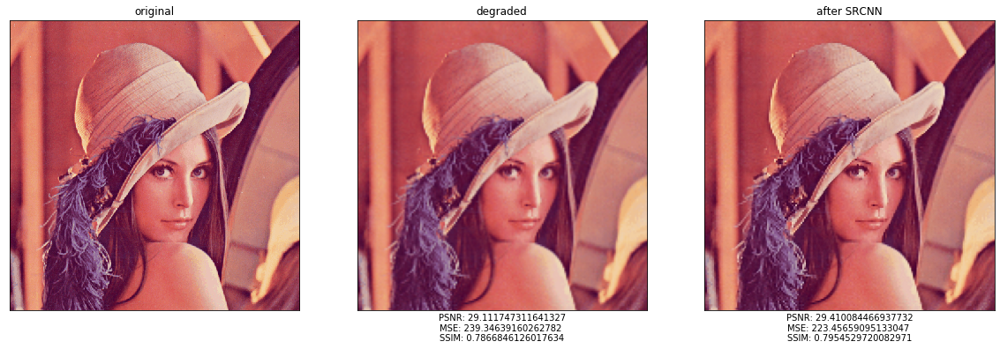

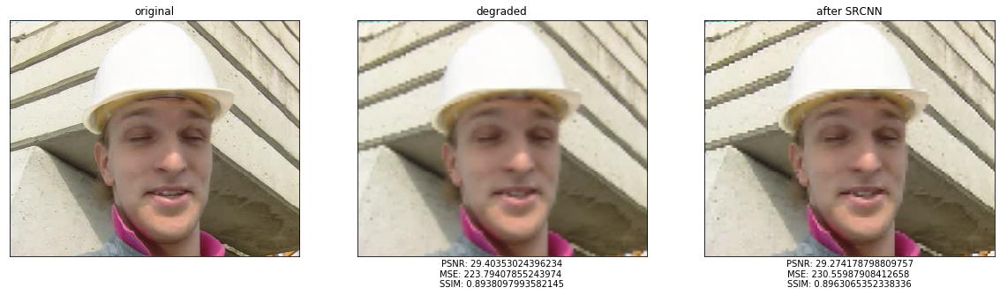

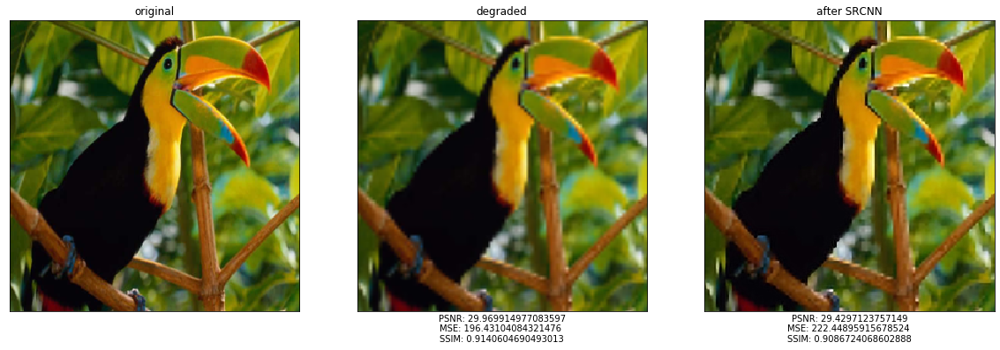

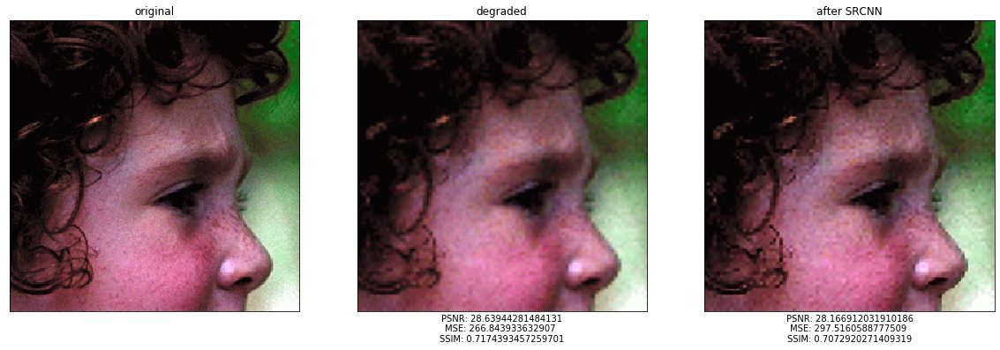

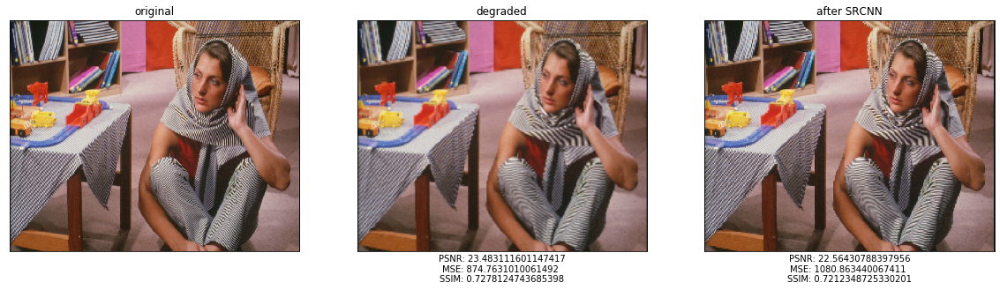

...

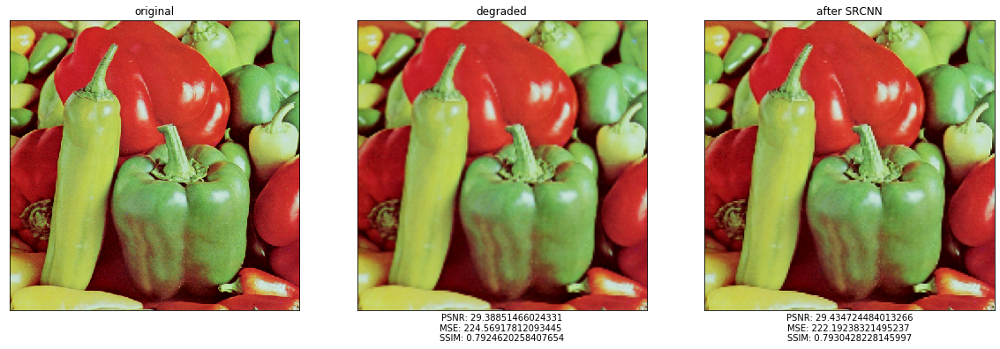

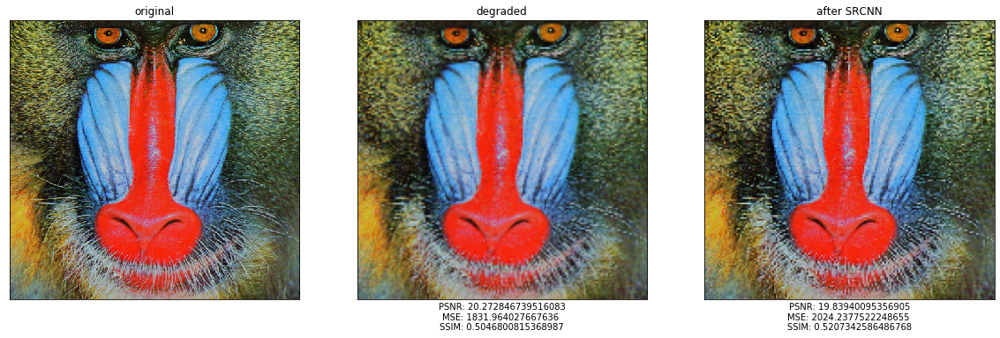

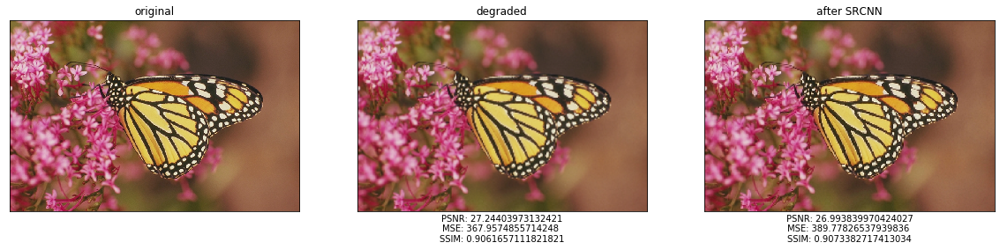

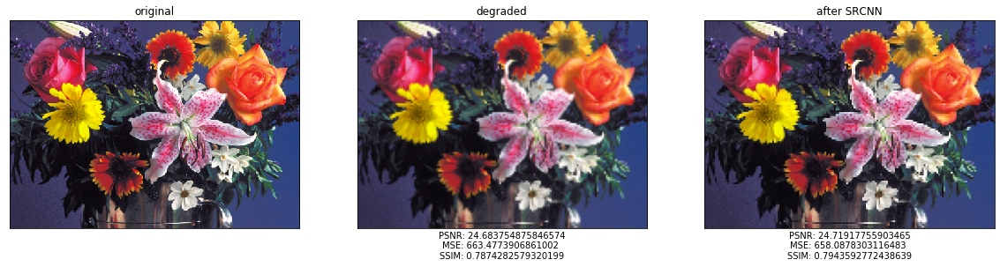

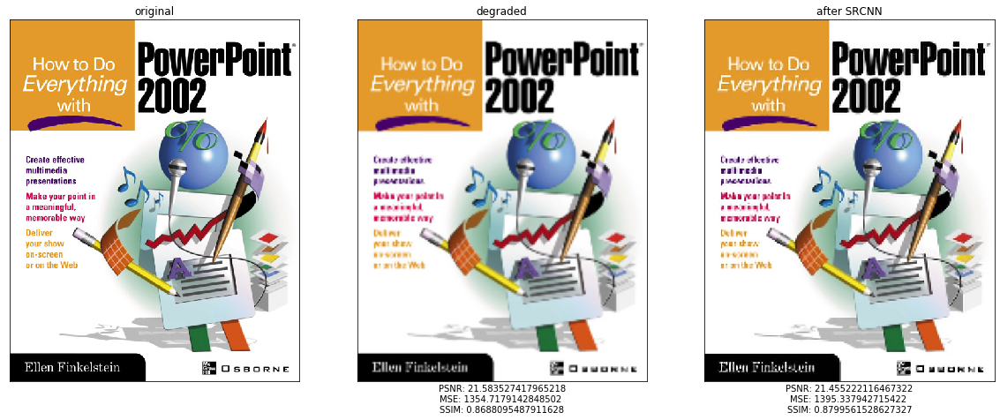

In [87]:
for file in os.listdir('degraded2'):
    ref , deg, output , scores = predict('degraded/{}' .format(file))
    fig , axs = plt.subplots(1, 3, figsize = (20,8))
    
    axs[0].imshow(cv2.cvtColor(ref , cv2.COLOR_BGR2RGB))
    axs[0].set_title('original')
    
    axs[1].imshow(cv2.cvtColor(deg , cv2.COLOR_BGR2RGB))
    axs[1].set_title('degraded')
    axs[1].set(xlabel = 'PSNR: {}\nMSE: {} \nSSIM: {}'.format(scores[0][0], scores[0][1], scores[0][2]))
    
    axs[2].imshow(cv2.cvtColor(output , cv2.COLOR_BGR2RGB))
    axs[2].set_title('after SRCNN')
    axs[2].set(xlabel = 'PSNR: {}\nMSE: {} \nSSIM: {}'.format(scores[1][0], scores[1][1], scores[1][2]))
    
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])
        
    fig.savefig('output2/{}.png' .format(os.path.splitext(file)[0]))